In [1]:
import logging

# to be added to requirements.txt
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans

import cv2
import matplotlib.pyplot as plt
import numpy as np
from scipy.cluster.hierarchy import dendrogram, linkage
from scipy.spatial.distance import squareform

from project_panaroma import Stitcher
from recommender import HierarchicalClustering, StitcherWithRecommender
logging.basicConfig(level=logging.INFO)

In [2]:
stitcher1 = StitcherWithRecommender()
stitcher1.input_dir = 'data/gallery_full'
stitcher1.read_input_dir()

Found 50 images in the input directory.


# Feature Engineering

In [3]:
# Set SIFT-specific parameters
stitcher1.sift_nfeatures = 500
stitcher1.sift_nOctaveLayers = 4               # Increase the octave layers to detect finer details
stitcher1.sift_contrastThreshold = 0.04        # Lower the contrast threshold to detect more low-contrast features
stitcher1.sift_edgeThreshold = 10              # Increase edge threshold to reduce edge-sensitive keypoints
stitcher1.sift_sigma = 1.6                     # Adjust sigma for different Gaussian blur levels


stitcher1.plot = False
stitcher1.detect_keypoints_and_descriptors()

Detected 500 keypoints in image 1 using SIFT.
Detected 501 keypoints in image 2 using SIFT.
Detected 500 keypoints in image 3 using SIFT.
Detected 500 keypoints in image 4 using SIFT.
Detected 500 keypoints in image 5 using SIFT.
Detected 500 keypoints in image 6 using SIFT.
Detected 500 keypoints in image 7 using SIFT.
Detected 500 keypoints in image 8 using SIFT.
Detected 500 keypoints in image 9 using SIFT.
Detected 501 keypoints in image 10 using SIFT.
Detected 500 keypoints in image 11 using SIFT.
Detected 500 keypoints in image 12 using SIFT.
Detected 500 keypoints in image 13 using SIFT.
Detected 501 keypoints in image 14 using SIFT.
Detected 500 keypoints in image 15 using SIFT.
Detected 500 keypoints in image 16 using SIFT.
Detected 501 keypoints in image 17 using SIFT.
Detected 485 keypoints in image 18 using SIFT.
Detected 500 keypoints in image 19 using SIFT.
Detected 500 keypoints in image 20 using SIFT.
Detected 500 keypoints in image 21 using SIFT.
Detected 501 keypoints

In [4]:
feature_set = stitcher1.get_consolidated_feature_vectors()
feature_set.shape

(50, 64000)

- The above shape is = (no.of images, no. of features * 128)

- As the above shape is too large, using it directly will be computationally expensive and not scalable for machine learning models with large datasets.
- Hence we use PCA to reduce the dimensionality of the data.

# PCA - Dimensionality Reduction

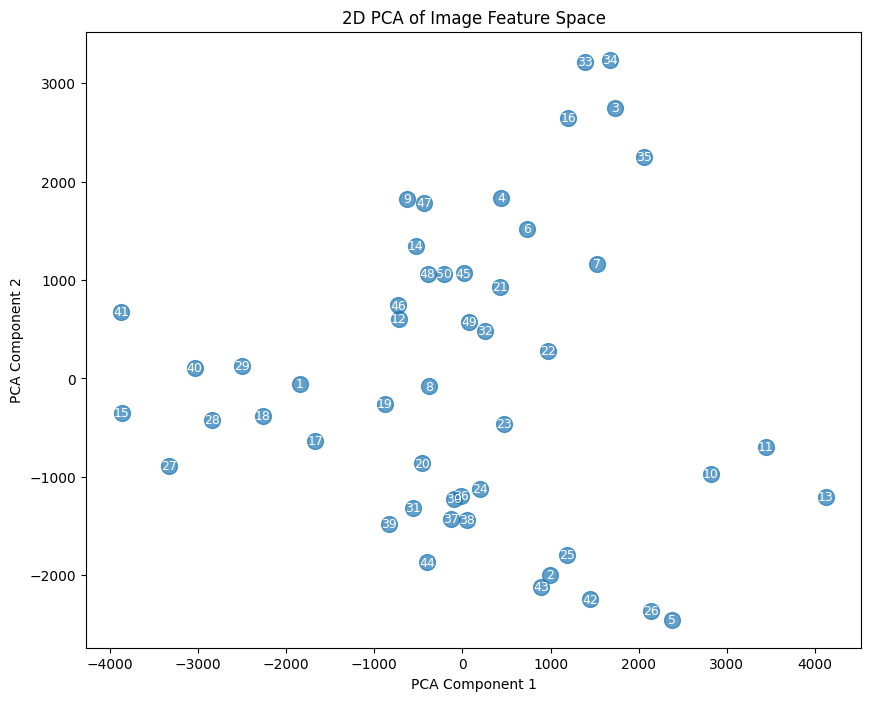

In [5]:
stitcher1.plot_pca_feature_space()

# K-means clustering

INFO:root:K=1, Inertia=510229179.16962343
INFO:root:K=2, Inertia=424429826.99109626
INFO:root:K=3, Inertia=373165332.1316175
INFO:root:K=4, Inertia=308428549.6016451
INFO:root:K=5, Inertia=271711621.1957495
INFO:root:K=6, Inertia=228093227.9278902
INFO:root:K=7, Inertia=213967363.51127705
INFO:root:K=8, Inertia=174551324.53928313
INFO:root:K=9, Inertia=150630054.7911941
INFO:root:K=10, Inertia=140996736.04695615


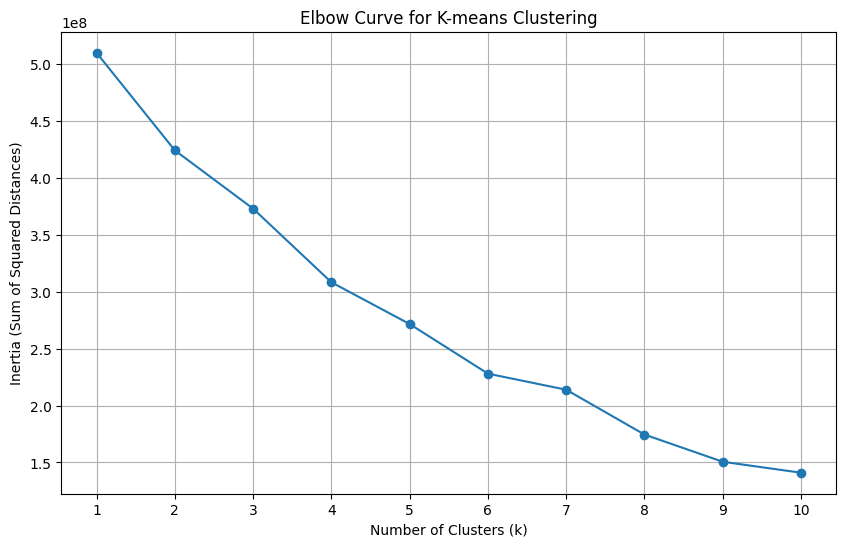

In [6]:
stitcher1.plot_kmeans_elbow_curve(max_k=10, num_components_pca=5)

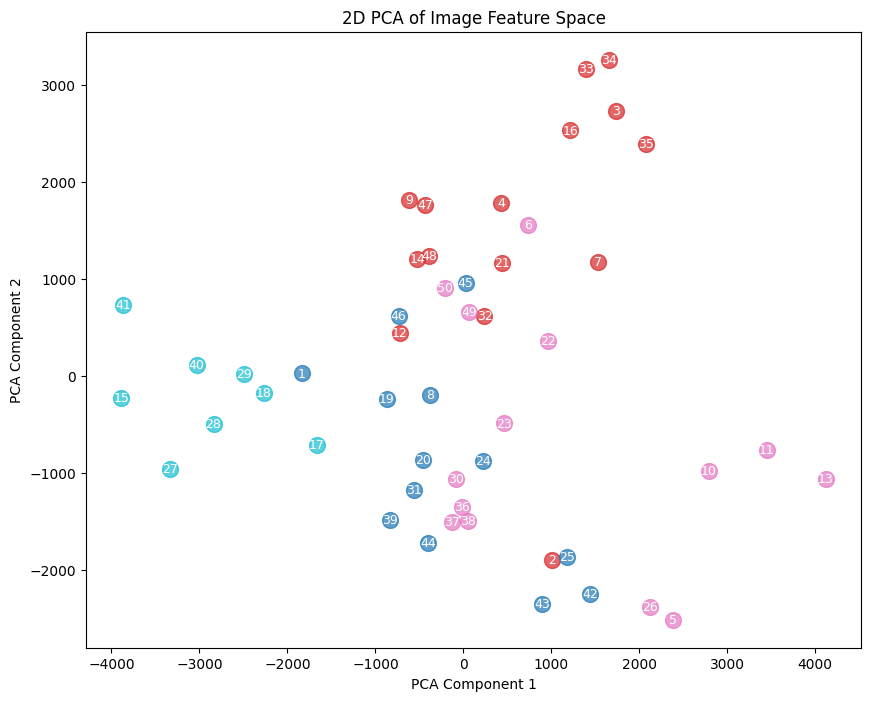

In [7]:
cluster_labels = stitcher1.apply_kmeans(
                                    num_clusters=4, 
                                    num_components_pca=5
                                    )

stitcher1.plot_pca_feature_space(kmeans_labels=cluster_labels)

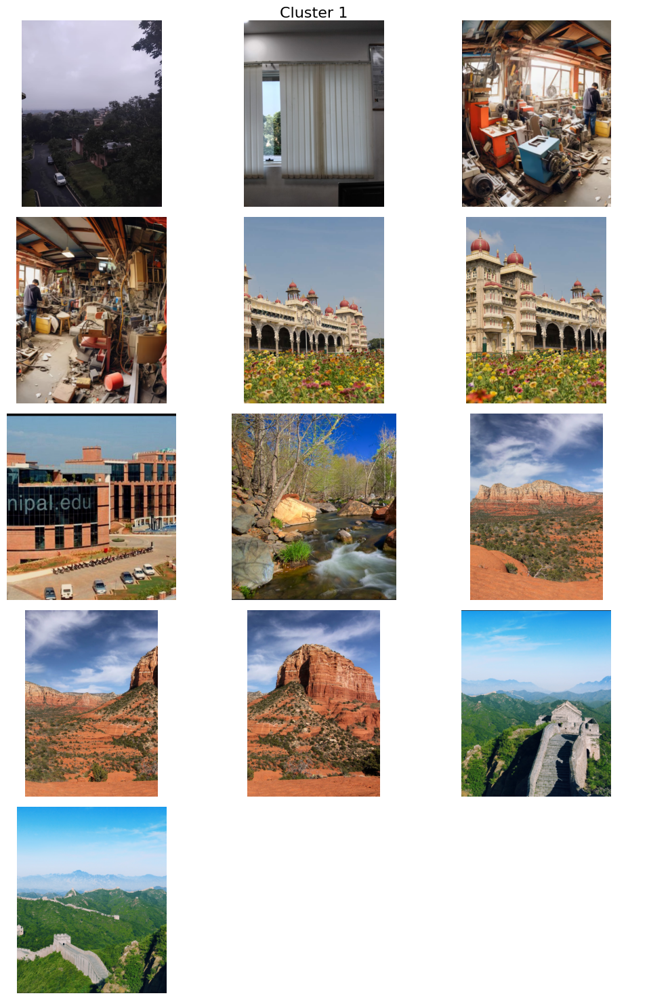

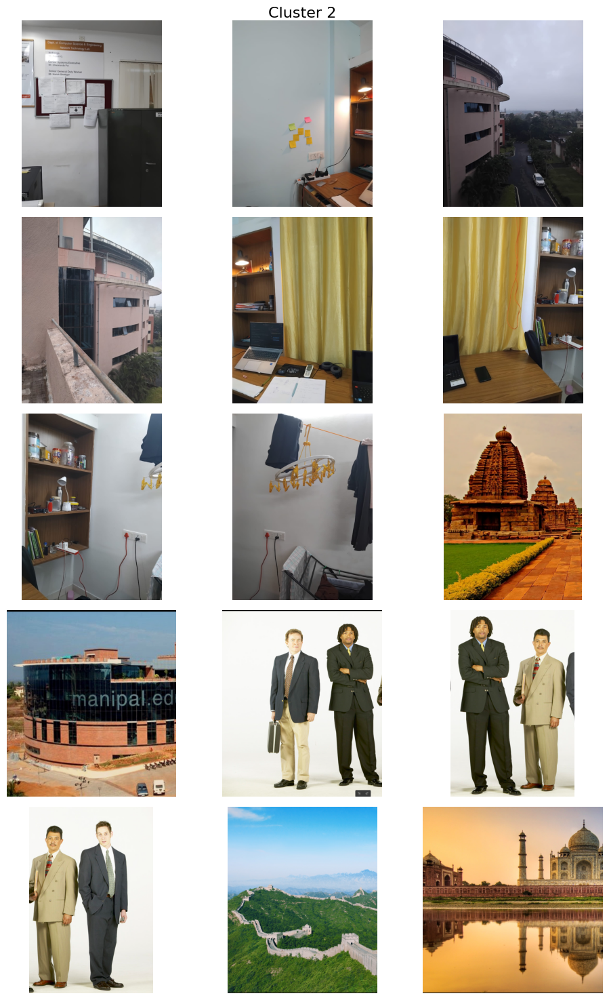

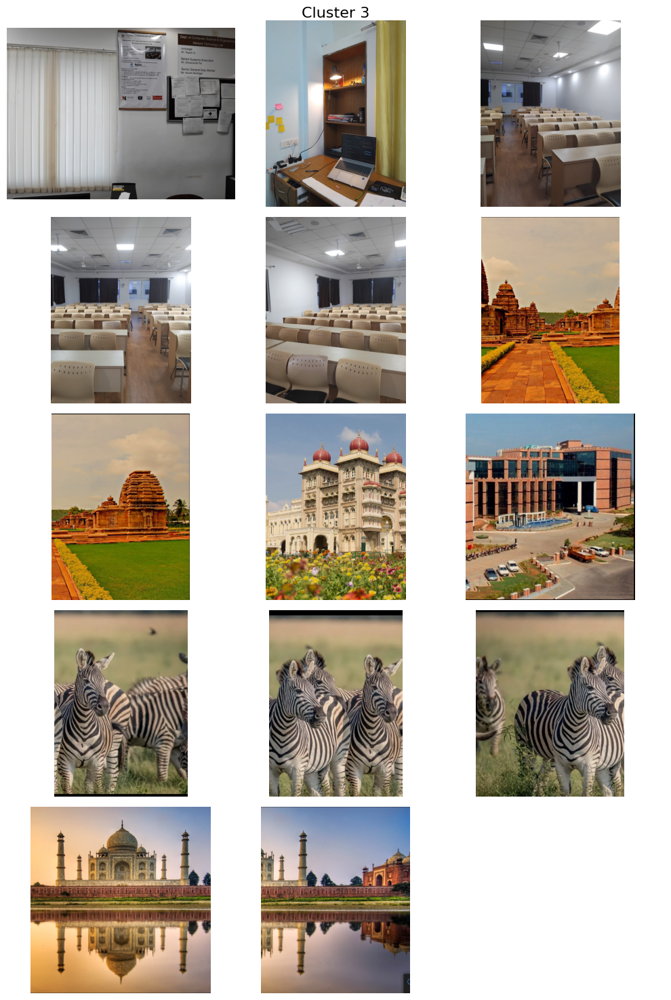

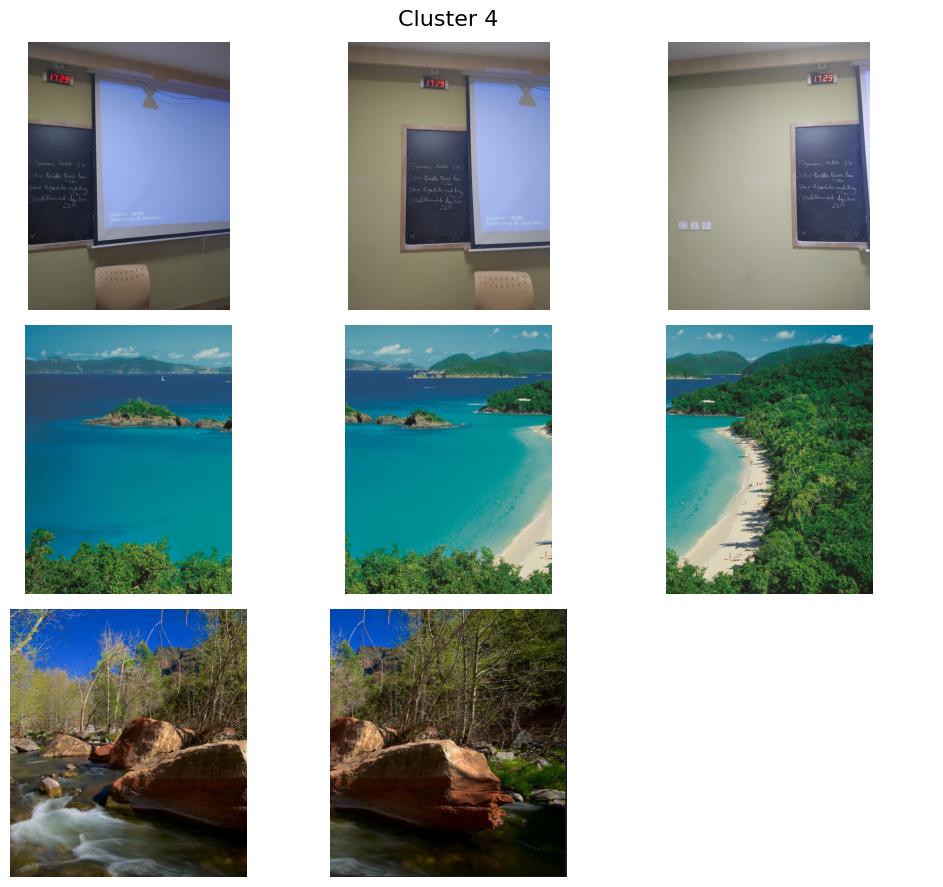

In [8]:
cluster_viz = [[i for i, label in enumerate(cluster_labels) if label == cluster_id] for cluster_id in range(5)]
stitcher1.show_clustered_images(cluster_viz)

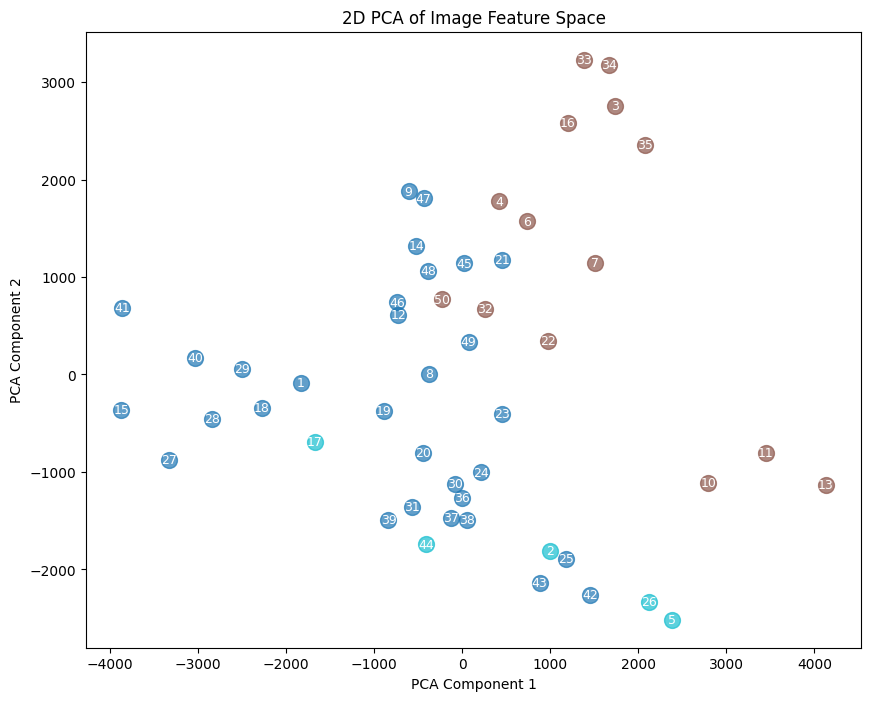

In [9]:
cluster_labels = stitcher1.apply_kmeans(num_clusters=3, num_components_pca=5)
stitcher1.plot_pca_feature_space(kmeans_labels=cluster_labels)

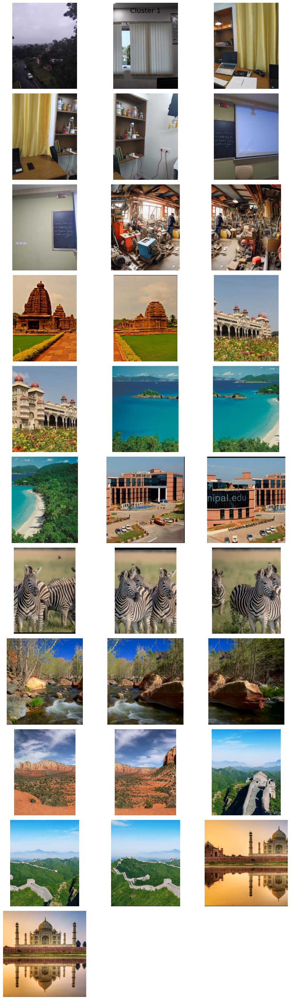

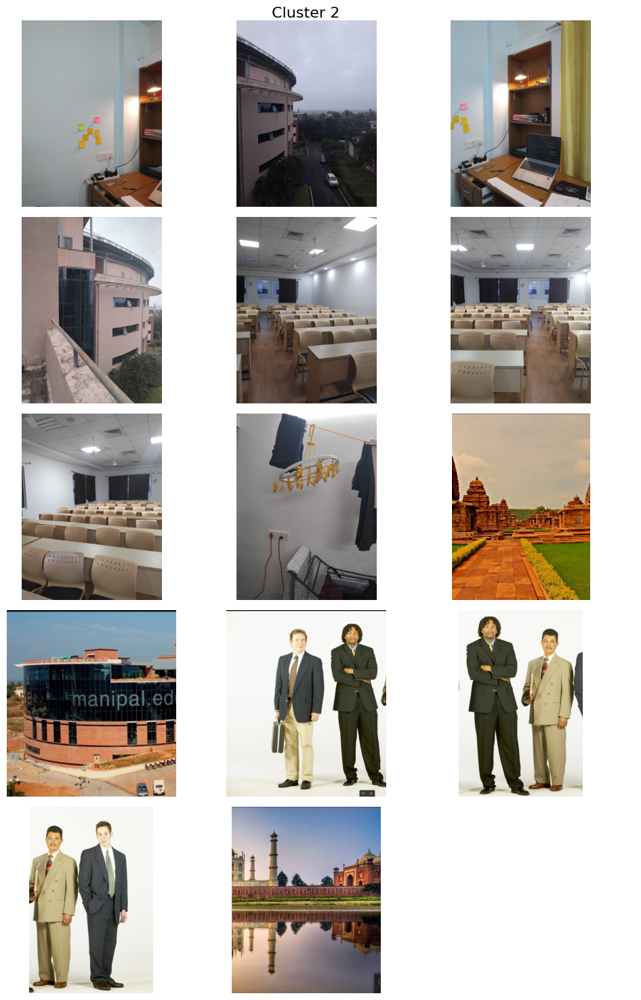

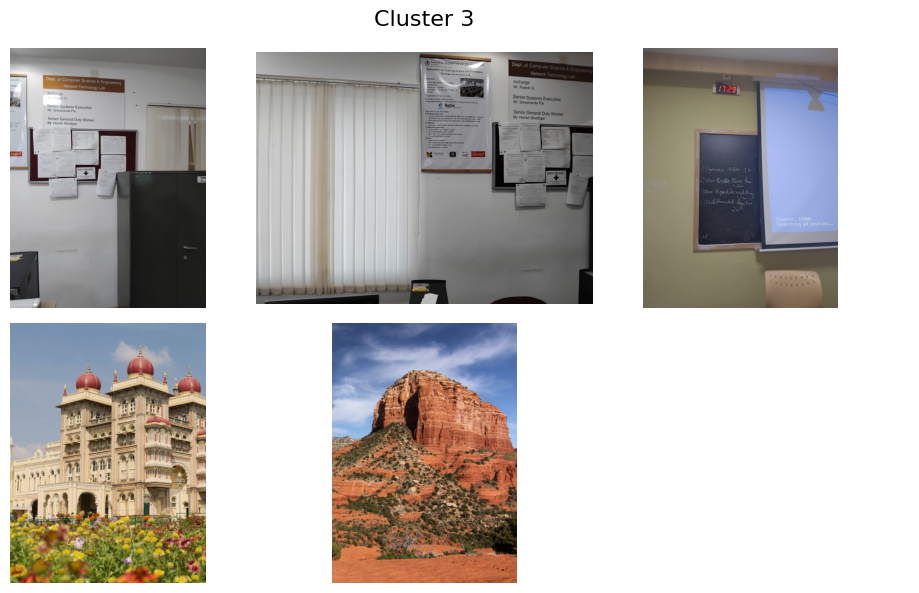

In [10]:
cluster_viz = [[i for i, label in enumerate(cluster_labels) if label == cluster_id] for cluster_id in range(5)]
stitcher1.show_clustered_images(cluster_viz)

- K-Means clustering is a type of unsupervised learning, which is used when you have unlabeled data, making it suitable to break down a large dataset of images in a gallery into smaller groups based on similaruty.
- However it's not ideal for specific stitching recommdations as it's not able to capture the spatial relationships betweeen images that may be far from eachother, but in the same sequence.
- Hence we use a hierarchial clustering algorithm to group images based on their spatial relationships.

- So, K-means is used to group images into smaller manageable clusters, which are then used to create a hierarchial clustering algorithm.
- And PCA is used to reduce the dimensionality of the data, which can be configured with a trade-off between computational efficiency and model performance.

# Hierarchial Agglomerative Clustering

In [11]:
# Assuming `stitcher` is an instance of the Stitcher class
stitcher = StitcherWithRecommender()
stitcher.input_dir = "data/gallery_of_3s"
stitcher.output_dir = "data/gallery_of_3s_outputs"
stitcher.plot = False

stitcher.read_input_dir()
stitcher.detect_keypoints_and_descriptors()

Found 9 images in the input directory.
Detected 1659 keypoints in image 1 using SIFT.
Detected 1213 keypoints in image 2 using SIFT.
Detected 2921 keypoints in image 3 using SIFT.
Detected 971 keypoints in image 4 using SIFT.
Detected 1270 keypoints in image 5 using SIFT.
Detected 1391 keypoints in image 6 using SIFT.
Detected 812 keypoints in image 7 using SIFT.
Detected 470 keypoints in image 8 using SIFT.
Detected 357 keypoints in image 9 using SIFT.
Feature detection completed.


In [12]:
# Compute the similarity matrix for the images
similarity_matrix = stitcher.compute_pairwise_similarities()

# Create an instance of HierarchicalClustering to convert similarity to distance
hc = HierarchicalClustering(similarity_matrix)
distance_matrix = hc._convert_similarity_to_distance(similarity_matrix)

Found 200 good matches after ratio test.
Similarity between image 1 and image 2: 200 good matches
Found 36 good matches after ratio test.
Similarity between image 1 and image 3: 36 good matches
Found 33 good matches after ratio test.
Similarity between image 1 and image 4: 33 good matches
Found 21 good matches after ratio test.
Similarity between image 1 and image 5: 21 good matches
Found 22 good matches after ratio test.
Similarity between image 1 and image 6: 22 good matches
Found 8 good matches after ratio test.
Similarity between image 1 and image 7: 8 good matches
Found 25 good matches after ratio test.
Similarity between image 1 and image 8: 25 good matches
Found 26 good matches after ratio test.
Similarity between image 1 and image 9: 26 good matches
Found 294 good matches after ratio test.
Similarity between image 2 and image 3: 294 good matches
Found 31 good matches after ratio test.
Similarity between image 2 and image 4: 31 good matches
Found 46 good matches after ratio test

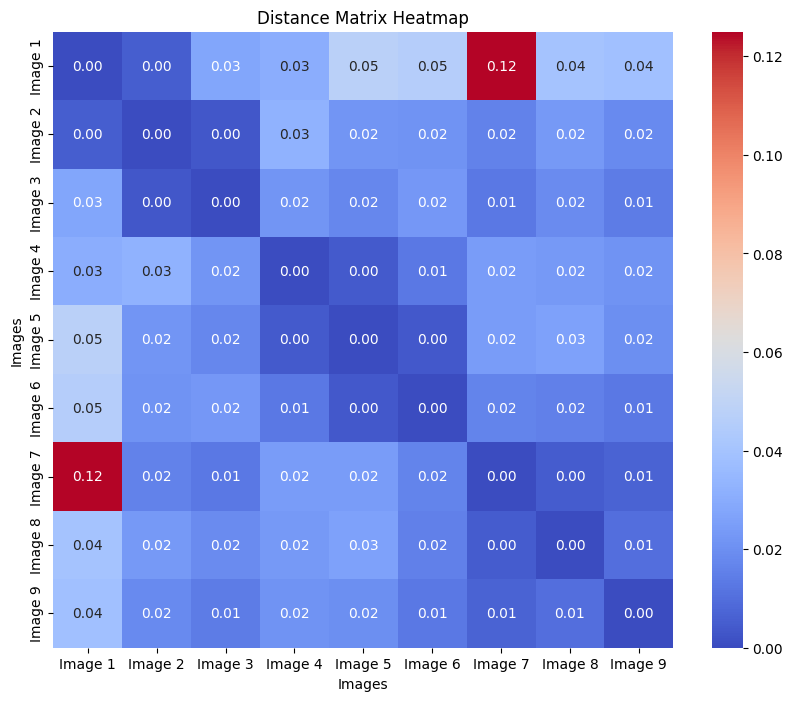

In [13]:

# Plot the heatmap of the initial distance matrix
stitcher.plot_distance_matrix_heatmap(distance_matrix)


Found 200 good matches after ratio test.
Similarity between image 1 and image 2: 200 good matches
Found 36 good matches after ratio test.
Similarity between image 1 and image 3: 36 good matches
Found 33 good matches after ratio test.
Similarity between image 1 and image 4: 33 good matches
Found 21 good matches after ratio test.
Similarity between image 1 and image 5: 21 good matches
Found 22 good matches after ratio test.
Similarity between image 1 and image 6: 22 good matches
Found 8 good matches after ratio test.
Similarity between image 1 and image 7: 8 good matches
Found 25 good matches after ratio test.
Similarity between image 1 and image 8: 25 good matches
Found 26 good matches after ratio test.
Similarity between image 1 and image 9: 26 good matches
Found 294 good matches after ratio test.
Similarity between image 2 and image 3: 294 good matches
Found 31 good matches after ratio test.
Similarity between image 2 and image 4: 31 good matches
Found 46 good matches after ratio test

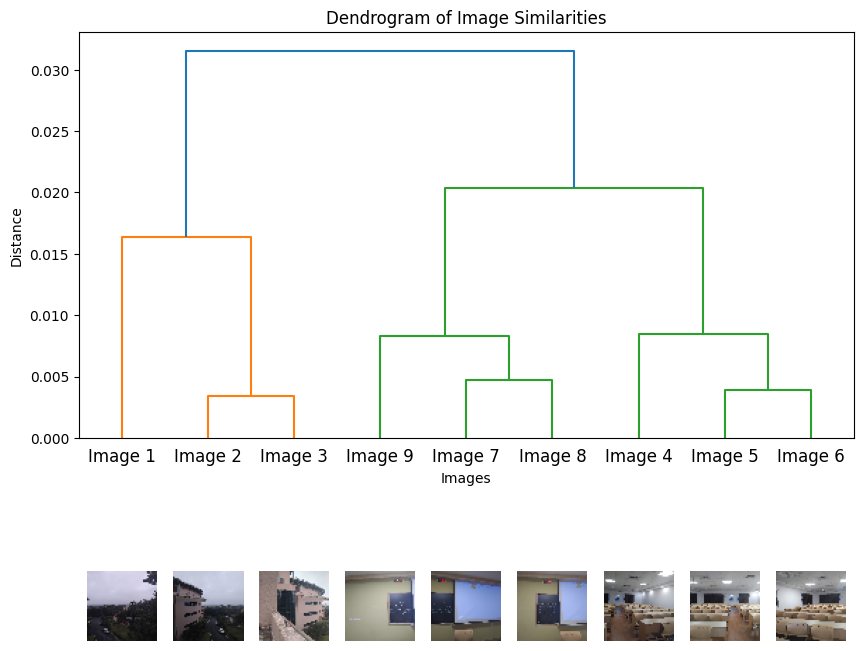

INFO:root:Merged clusters 1 and 2, new cluster: [1, 2]
INFO:root:Merged clusters 3 and 4, new cluster: [4, 5]
INFO:root:Merged clusters 4 and 5, new cluster: [6, 7]
INFO:root:Merged clusters 4 and 5, new cluster: [6, 7, 8]
INFO:root:Merged clusters 2 and 3, new cluster: [3, 4, 5]
INFO:root:Merged clusters 0 and 1, new cluster: [0, 1, 2]


Cluster 1: [1, 2, 3]
Cluster 2: [4, 5, 6]
Cluster 3: [7, 8, 9]
Detected 1659 keypoints in image 1 using SIFT.
Detected 1213 keypoints in image 2 using SIFT.
Detected 2921 keypoints in image 3 using SIFT.
Feature detection completed.
Detected 15455 keypoints in image using SIFT.
Detected 23318 keypoints in image using SIFT.
Preprocessed Stitched image saved to data/gallery_of_3s_outputs
Stitched panorama for cluster 1 saved.
Detected 971 keypoints in image 1 using SIFT.
Detected 1270 keypoints in image 2 using SIFT.
Detected 1391 keypoints in image 3 using SIFT.
Feature detection completed.
Detected 3462 keypoints in image using SIFT.
Detected 4205 keypoints in image using SIFT.
Preprocessed Stitched image saved to data/gallery_of_3s_outputs
Stitched panorama for cluster 2 saved.
Detected 812 keypoints in image 1 using SIFT.
Detected 470 keypoints in image 2 using SIFT.
Detected 357 keypoints in image 3 using SIFT.
Feature detection completed.
Detected 797 keypoints in image using SIFT.

In [14]:

recommended_image_groups = stitcher.recommend_images(
    num_clusters=len(stitcher.input_images) // 3
)
stitcher.stitch_recommended_images(recommended_image_groups)
similarity_matrix = stitcher.compute_pairwise_similarities()

hc = HierarchicalClustering(similarity_matrix)
hc2 = HierarchicalClustering(similarity_matrix)
cluster_labels = hc2.fit(num_clusters=3)
distance_matrix = hc._convert_similarity_to_distance(similarity_matrix)

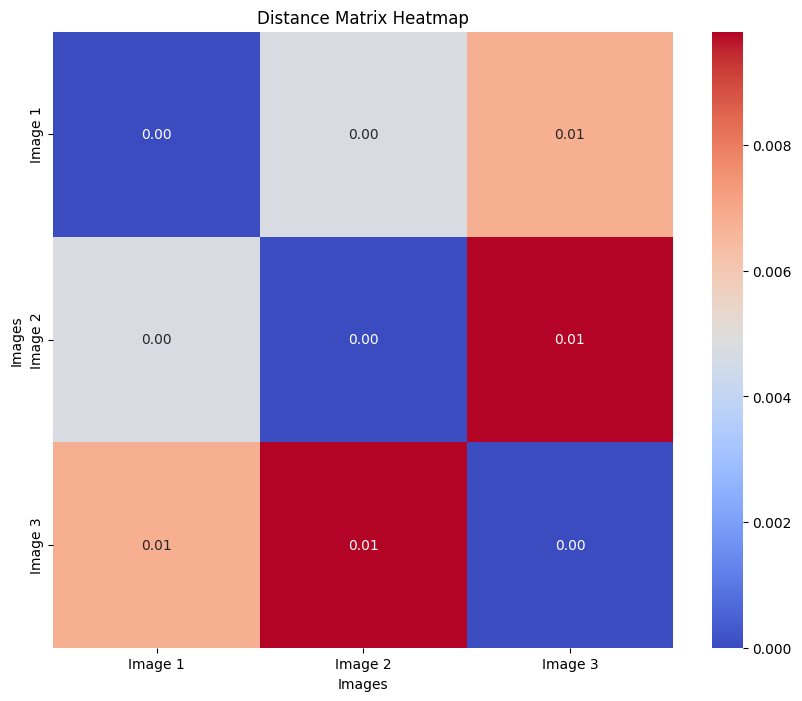

In [15]:
stitcher.plot_distance_matrix_heatmap(distance_matrix)

Found 9 images in the input directory.


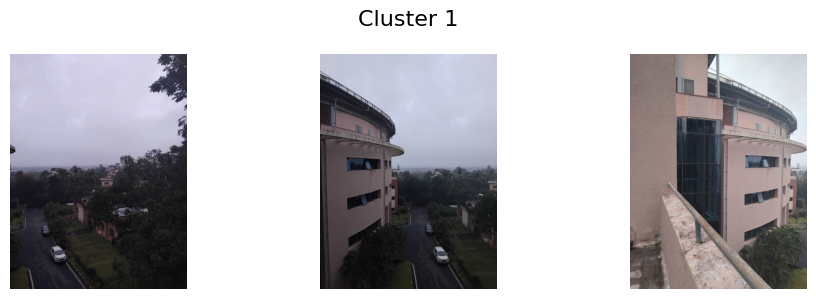

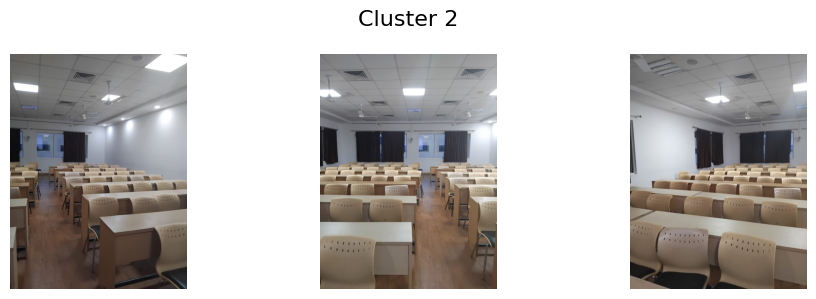

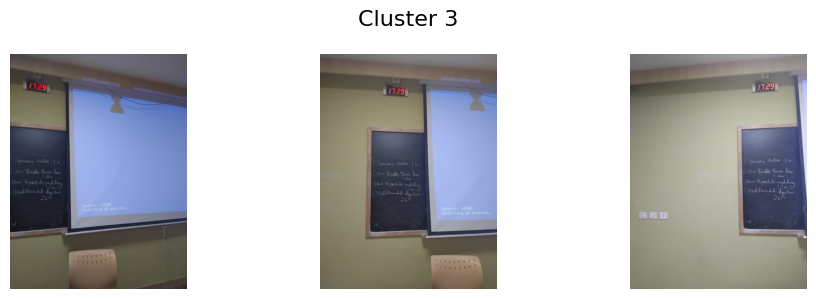

In [16]:
stitcher.read_input_dir()
stitcher.show_clustered_images(stitcher.reccomended_clusters)